# Initial EDA: Laying the Foundation for Insightful Data Exploration

# Step 1. Import library

In [1]:
import pandas as pd; pd.options.mode.chained_assignment = None
import numpy as np

# Built In Imports
from datetime import datetime
from glob import glob
import warnings
import IPython
import urllib
import zipfile
import pickle
import shutil
import string
import math
import tqdm
import time
import os
import gc
import re

# Visualization Imports
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from PIL import Image
import matplotlib
import plotly
import PIL
import cv2
from pycocotools.coco import COCO

# Other Imports
from tqdm.notebook import tqdm

LABEL_COLORS = [px.colors.label_rgb(px.colors.convert_to_RGB_255(x)) for x in sns.color_palette("Spectral", 10)]
LABEL_COLORS_WOUT_NO_FINDING = LABEL_COLORS[:8]+LABEL_COLORS[9:]

# Step 2. Convert json to dataframe

In [2]:
coco = COCO('../dataset/train.json')

train_df = pd.DataFrame()

image_ids = []
class_name = []
class_id = []
x_min = []
y_min = []
x_max = []
y_max = []
classes = ["General trash", "Paper", "Paper pack", "Metal", "Glass", 
           "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing"]

base_path = 'train/images/'

for image_id in coco.getImgIds():
        
    image_info = coco.loadImgs(image_id)[0]
    ann_ids = coco.getAnnIds(imgIds=image_info['id'])
    anns = coco.loadAnns(ann_ids)
        
    # file_name = image_info['file_name']
    file_name = base_path + os.path.basename(image_info['file_name'])
        
    for ann in anns:
        image_ids.append(file_name)
        class_name.append(classes[ann['category_id']])
        class_id.append(ann['category_id'])
        x_min.append(float(ann['bbox'][0]))
        y_min.append(float(ann['bbox'][1]))
        x_max.append(float(ann['bbox'][0]) + float(ann['bbox'][2]))
        y_max.append(float(ann['bbox'][1]) + float(ann['bbox'][3]))

train_df['image_id'] = image_ids
train_df['class_name'] = class_name
train_df['class_id'] = class_id
train_df['x_min'] = x_min
train_df['y_min'] = y_min
train_df['x_max'] = x_max
train_df['y_max'] = y_max

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


In [ ]:
train_df

,image_id,class_name,class_id,x_min,y_min,x_max,y_max
0,train/images/0000.jpg,General trash,0,197.6,193.7,745.4,663.4
1,train/images/0001.jpg,Metal,3,0.0,407.4,57.6,588.0
2,train/images/0001.jpg,Plastic bag,7,0.0,455.6,144.6,637.2
3,train/images/0001.jpg,Glass,4,722.3,313.4,996.6,565.3
4,train/images/0001.jpg,Plastic,5,353.2,671.0,586.9,774.4
...,...,...,...,...,...,...,...
23139,train/images/4882.jpg,Plastic,5,0.0,116.2,944.1,930.3
23140,train/images/4882.jpg,Plastic bag,7,302.1,439.3,567.3,655.4
23141,train/images/4882.jpg,General trash,0,511.3,451.1,570.0,481.3
23142,train/images/4882.jpg,Paper,1,255.0,421.4,526.7,616.5


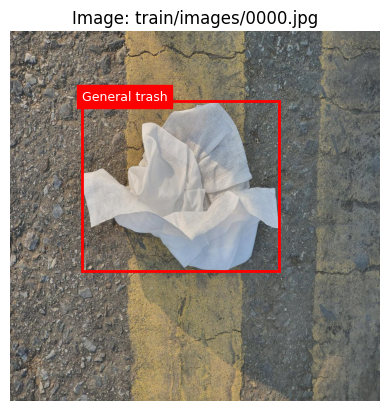

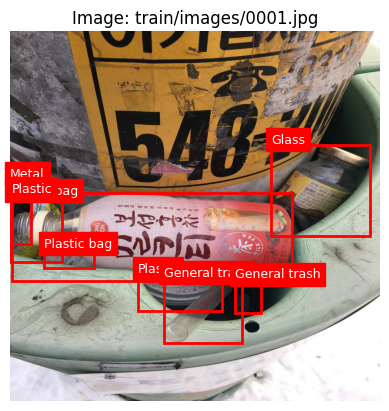

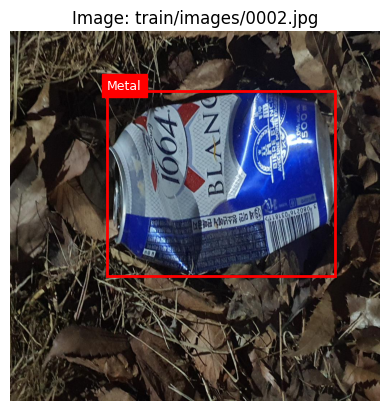

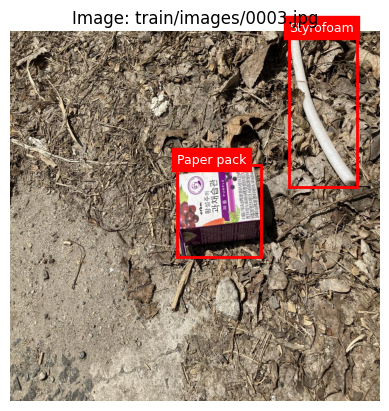

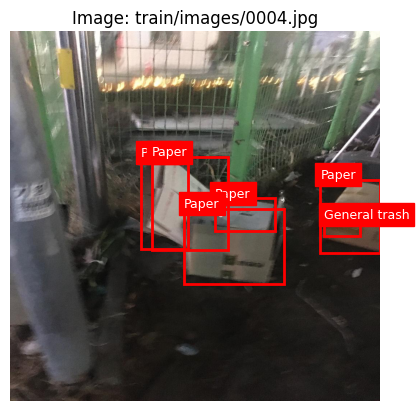

In [4]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_images(train_df, img_folder, num_images=5):
    """
    주어진 데이터프레임에서 이미지를 시각화하고 바운딩 박스를 표시합니다.
    
    Parameters:
    - train_df: 바운딩 박스와 클래스 정보를 포함한 데이터프레임
    - img_folder: 이미지 파일들이 저장된 폴더 경로
    - num_images: 출력할 이미지 개수 (기본값 5개)
    """
    unique_images = train_df['image_id'].unique()[:num_images]
    
    for img_file in unique_images:
        # 이미지 로드
        img_path = os.path.join(img_folder, img_file)
        img = Image.open(img_path)
        
        # 이미지 관련 바운딩 박스 데이터 추출
        img_data = train_df[train_df['image_id'] == img_file]
        
        # 이미지 출력
        fig, ax = plt.subplots(1)
        ax.imshow(img)
        
        # 바운딩 박스 그리기
        for _, row in img_data.iterrows():
            # 바운딩 박스 정보 가져오기
            x_min, y_min, x_max, y_max = row['x_min'], row['y_min'], row['x_max'], row['y_max']
            width, height = x_max - x_min, y_max - y_min
            
            # 바운딩 박스 그리기
            rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            
            # 클래스 이름 표시
            plt.text(x_min, y_min - 5, row['class_name'], color='white', backgroundcolor='red', fontsize=9)
        
        plt.title(f"Image: {img_file}")
        plt.axis('off')
        plt.show()

# 이미지가 저장된 폴더 경로
img_folder = '../dataset' # '../dataset/'

# 이미지 시각화 (출력할 이미지 개수 지정)
visualize_images(train_df, img_folder, num_images=5)

img_folder = '../dataset/train'
-->
FileNotFoundError: [Errno 2] No such file or directory: '../dataset/train/train/0000.jpg'

- test.json에는 클래스(카테고리)정보와 bbox정보가 없으므로 단순 이미지만 출력해봄

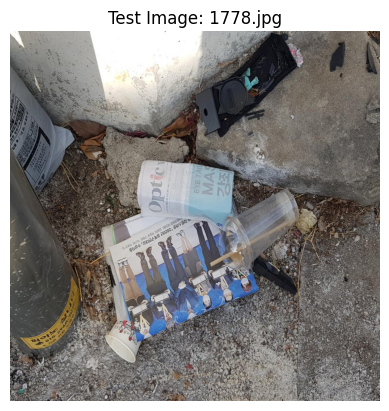

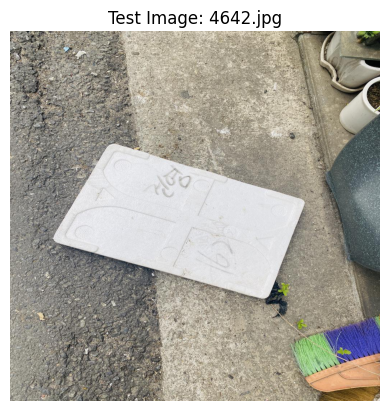

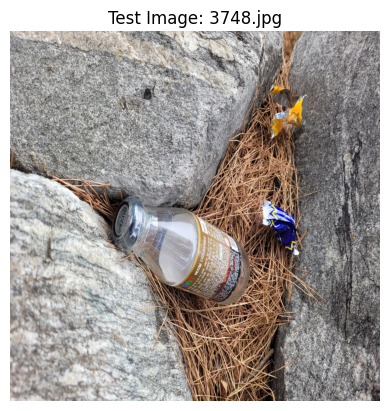

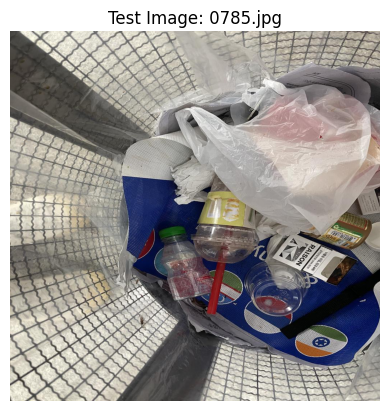

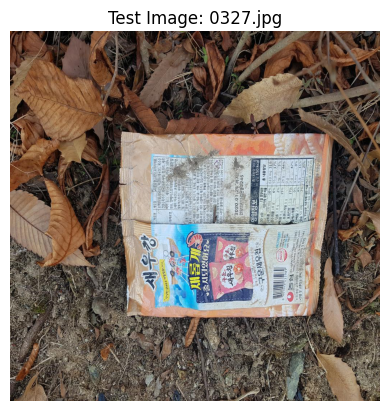

In [5]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def visualize_test_images_only(img_folder, num_images=5):
    """
    테스트 이미지 파일들을 시각화합니다.
    
    Parameters:
    - img_folder: 이미지 파일들이 저장된 폴더 경로
    - num_images: 출력할 이미지 개수 (기본값 5개)
    """
    img_files = os.listdir(img_folder)[:num_images]
    
    for img_file in img_files:
        # 이미지 로드
        img_path = os.path.join(img_folder, img_file)
        img = Image.open(img_path)
        
        # 이미지 출력
        plt.figure()
        plt.imshow(img)
        plt.title(f"Test Image: {img_file}")
        plt.axis('off')
        plt.show()

# 테스트 이미지가 저장된 폴더 경로
test_img_folder = '../dataset/test'

# 테스트 이미지 시각화 (출력할 이미지 개수 지정)
visualize_test_images_only(test_img_folder, num_images=5)

# Step 3. EDA

## Annotation Per Images

: 한 이미지에 몇 개의 Bounding box가 있는지, 그 분포를 나타낸 결과입니다.

In [6]:
fig = px.histogram(train_df.image_id.value_counts(), 
                   log_y=True, color_discrete_sequence=['indianred'], opacity=0.7,
                   labels={"value":"Number of Annotations Per Image"},
                   title="<b>DISTRIBUTION OF # OF ANNOTATIONS PER IMAGE   " 
                         "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.update_layout(showlegend=False,
                  xaxis_title="<b>Number of Unique Images</b>",
                  yaxis_title="<b>Count of All Object Annotations</b>",)
fig.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

-->

pip install --upgrade nbformat

## Unique Class Per Image
: 한 이미지의 몇 개의 unique한 class가 있는지, 그 분포를 나타낸 결과입니다.

In [7]:
fig = px.histogram(train_df.groupby('image_id')["class_id"].unique().apply(lambda x: len(x)), 
             log_y=True, color_discrete_sequence=['skyblue'], opacity=0.7,
             labels={"value":"Number of Unique class"},
             title="<b>DISTRIBUTION OF # OF Unique Class PER IMAGE   " 
                   "<i><sub>(Log Scale for Y-Axis)</sub></i></b>",
                   )
fig.update_layout(showlegend=False,
                  xaxis_title="<b>Number of Unique CLASS</b>",
                  yaxis_title="<b>Count of Unique IMAGE</b>",)
fig.show()

여러 클래스가 함께 등장하는 경우가 있는지 분석. 특정 클래스 쌍이 자주 함께 등장하는지 확인하자.

이 행렬은 한 이미지에서 두 개의 클래스가 동시에 등장하는 경우를 나타냄.

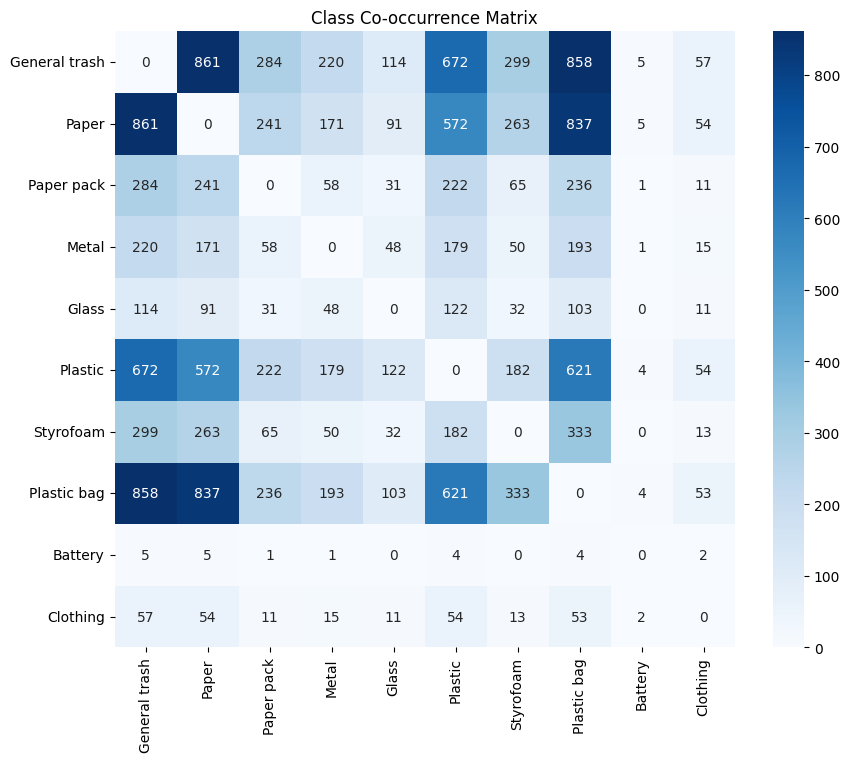

In [8]:
from itertools import combinations
from collections import defaultdict

co_occurrence_matrix = np.zeros((len(classes), len(classes)), dtype=int)
for image_id in train_df['image_id'].unique():
    labels_in_image = train_df[train_df['image_id'] == image_id]['class_id'].unique()
    for pair in combinations(labels_in_image, 2):
        co_occurrence_matrix[pair[0], pair[1]] += 1
        co_occurrence_matrix[pair[1], pair[0]] += 1

fig = plt.figure(figsize=(10, 8))
sns.heatmap(co_occurrence_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=classes, yticklabels=classes)
plt.title("Class Co-occurrence Matrix")
plt.show()

- (paper, general trash), (plastic bag, general trash), (plastic, general trash), (plastic, paper), (plastic bag, paper), (plastic bag, plastic) 이 한 이미지에서 동시에 등장하는 경우가 많음.

- battery의 bbox(annotation)개수가 159개인데 위의 행렬 결과를 보면 22개만 다른 쓰레기들과 함께 이미지에 등장하고 나머지 137개는 이미지에 단독으로 등장한다는 것을 알 수 있음. -> 어떤 인사이트를 뽑을 수 있을까..


[모델 성능 up 가설]

1. 자주 함께 등장하는 클래스 쌍의 경우, 데이터 증강 기법을 사용하여 더 많은 학습 샘플을 생성 -> 해당 클래스들이 함께 등장하는 이미지들을 copy-paste(?), flip 등으로 더 많이 생성하여 학습
2. 자주 등장하는 클래스 쌍을 기반으로 CutMix나 MixUp과 같은 혼합 증강 기법을 사용하여 이미지 간 경계를 부드럽게 만드는 것도 좋은 방법이 될수도. 이는 모델이 클래스를 개별적으로 인식하는 능력을 높이면서, 클래스 간 경계를 명확히 이해하는 데 도움이 될 듯.
3. 클래스 간 상관관계를 반영한 손실 함수 개선 : 클래스 간 동시 발생 빈도가 높은 쌍에 대해, 해당 클래스들이 함께 예측되지 않았을 경우 손실 값을 높이는 방식을 고려할 수 있습니다. 반대로 자주 동시 발생하지 않는 클래스 쌍에 대해서는 예측 오류에 대한 페널티를 줄여줄 수 있습니다.
- Custom Loss Function을 만들어 자주 등장하는 클래스 쌍에 대해 더 큰 가중치를 부여

<!-- class CustomLoss(nn.Module):
    def __init__(self, co_occurrence_matrix):
        super(CustomLoss, self).__init__()
        self.co_occurrence_matrix = co_occurrence_matrix

    def forward(self, predictions, targets):
        loss = F.cross_entropy(predictions, targets)
        
        # 추가적으로 클래스 동시 발생 빈도를 반영한 손실 값 계산
        for pred, target in zip(predictions, targets):
            if self.co_occurrence_matrix[target.item()][pred.argmax().item()] > 0:
                loss += additional_penalty  # 동시 발생한 클래스 쌍에 대해 페널티 추가
        
        return loss -->
 

4. 후처리(Post-processing) 단계에서의 조정

예측 단계에서 동시 발생 클래스 정보를 후처리에 활용할 수 있습니다. 예를 들어, 모델이 특정 클래스 A를 예측했다면, 해당 클래스와 자주 동시 발생하는 클래스 B도 함께 예측되었는지 확인하고, 그렇지 않을 경우 B에 대한 확률을 보정하는 방식입니다. 이 방식은 Conditional Random Fields(CRF) 같은 기법과 결합하여 공간적 또는 클래스 간 관계를 모델링하는 데 사용할 수 있습니다.

5. Attention Mechanism 도입

Attention Mechanism을 도입하여, 동시 발생하는 클래스 간의 관계에 주목하게 만들 수 있습니다. 예를 들어, 모델이 "플라스틱"을 탐지했을 때, "플라스틱 백"에 대한 주의를 더 기울이도록 attention weights를 조정할 수 있습니다. 이는 클래스 간 문맥적 관계를 모델이 잘 파악할 수 있도록 도와줍니다.

## Annotations Per Class
: 각 Class 당 몇 개의 Annotation, 즉 bbox가 있는지, 그 분포를 나타낸 결과입니다.

In [9]:
fig = px.bar(train_df.class_name.value_counts().sort_index(), 
             color=train_df.class_name.value_counts().sort_index().index, opacity=0.85,
             color_discrete_sequence=LABEL_COLORS, log_y=True,
             labels={"y":"Annotations Per Class", "x":""},
             title="<b>Annotations Per Class</b>",)
fig.update_layout(legend_title=None,
                  xaxis_title="",
                  yaxis_title="<b>Annotations Per Class</b>")

fig.show()

Class imbalance가 심한 데이터셋이라고 생각되므로 focal loss를 적용하는 게 좋지 않을까 하는 가설을 세워 봄

In [10]:
class_counts = train_df['class_id'].value_counts().sort_index()

class_distribution = class_counts / class_counts.sum() * 100

# Pie Chart
fig = px.pie(values=class_distribution, names=classes, title="Class Proportions in Dataset")
fig.show()

In [11]:
# class_distribution = train_df['class_id'].value_counts(normalize=True) * 100 # class_id, class_name 아무거나 가능
# fig = px.pie(values=class_distribution, names=classes, title="Class Proportions in Dataset")
# fig.show()

## Object heatmap
: 이미지에서 bbox가 주로 어디에 위치하는지를 알아보기 위한 코드입니다.

  0%|          | 0/23144 [00:00<?, ?it/s]

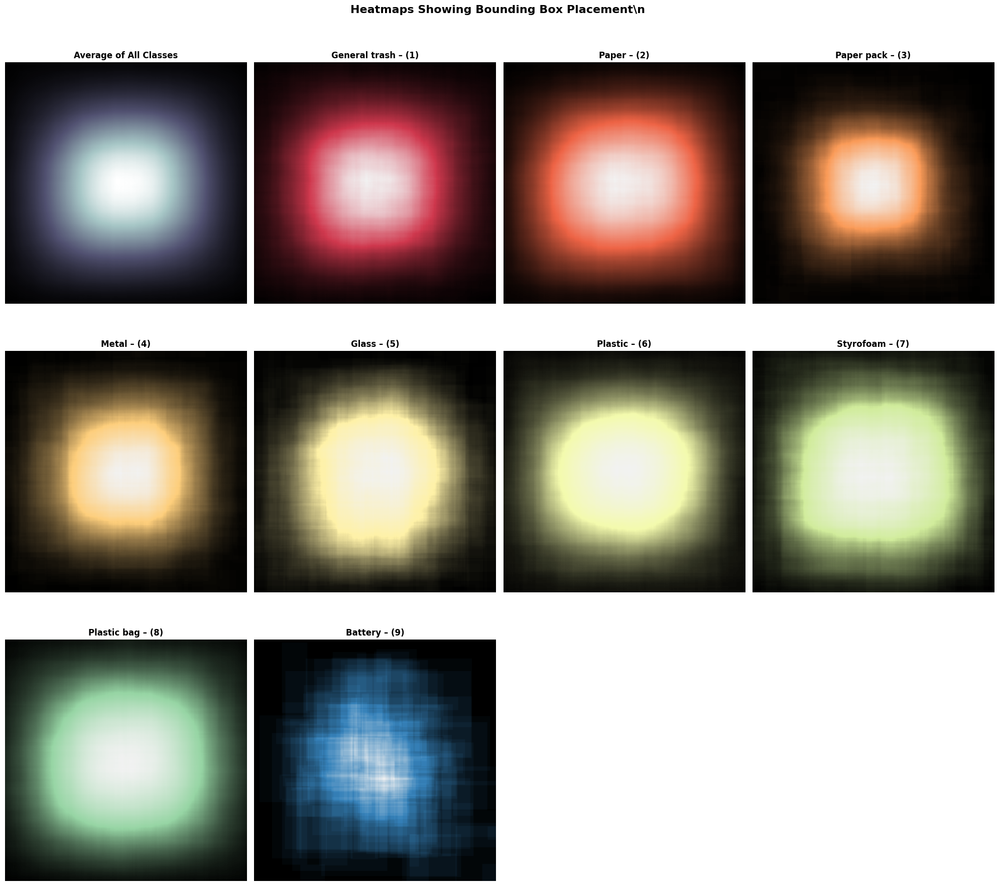

In [12]:
bbox_df = pd.DataFrame()
bbox_df['class_id'] = train_df['class_id'].values
bbox_df['class_name'] = train_df['class_name'].values
bbox_df['x_min'] = train_df['x_min'].values / 1024
bbox_df['x_max'] = train_df['x_max'].values / 1024
bbox_df['y_min'] = train_df['y_min'].values / 1024
bbox_df['y_max'] = train_df['y_max'].values / 1024
bbox_df['frac_x_min'] = train_df['x_min'].values / 1024
bbox_df['frac_x_max'] = train_df['x_max'].values / 1024
bbox_df['frac_y_min'] = train_df['y_min'].values / 1024
bbox_df['frac_y_max'] = train_df['y_max'].values / 1024

ave_src_img_height = 1024
ave_src_img_width = 1024

# DEFAULT
HEATMAP_SIZE = (ave_src_img_height, ave_src_img_width, 14)

# Initialize
heatmap = np.zeros((HEATMAP_SIZE), dtype=np.int16)
bbox_np = bbox_df[["class_id", "frac_x_min", "frac_x_max", "frac_y_min", "frac_y_max"]].to_numpy()
bbox_np[:, 1:3] *= ave_src_img_width
bbox_np[:, 3:5] *= ave_src_img_height
bbox_np = np.floor(bbox_np).astype(np.int16)

# Color map stuff
custom_cmaps = [
    matplotlib.colors.LinearSegmentedColormap.from_list(
        colors=[(0.,0.,0.), c, (0.95,0.95,0.95)], 
        name=f"custom_{i}") for i,c in enumerate(sns.color_palette("Spectral", 10))
]
custom_cmaps.pop(8) # Remove No-Finding

for row in tqdm(bbox_np, total=bbox_np.shape[0]):
    heatmap[row[3]:row[4]+1, row[1]:row[2]+1, row[0]] += 1
    
fig = plt.figure(figsize=(20,25))
plt.suptitle("Heatmaps Showing Bounding Box Placement\\n ", fontweight="bold", fontsize=16)
for i in range(10):
    plt.subplot(4, 4, i+1)
    if i==0:
        plt.imshow(heatmap.mean(axis=-1), cmap="bone")
        plt.title(f"Average of All Classes", fontweight="bold")
    else:
        plt.imshow(heatmap[:, :, i-1], cmap=custom_cmaps[i-1])
        plt.title(f"{classes[i-1]} – ({i})", fontweight="bold")
        
    plt.axis(False)
fig.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

- BBOX가 주로 어디에 위치하는지에 대한 히트맵을 보면 모든 클래스에서 정가운데 bbox가 가장 많음 -> 정가운데 위치하는 물체들은 잘 detect되도록 학습 되지 않을까 하는 가설
- 팀원의 모델 실험 결과 작은 물체(아마 가장자리들에 위치하는 물체들?)들을 잘 찾지 못하는 문제가 있음
- center를 cutout, 모자이크 등으로 처리해서 가장자리 object들을 잘 맞추도록 augmentation을 진행해서 학습시키면 성능이 올라가지 않을까 라는 가설을 세워봄
- 가장자리 부분만 crop해서 data augmentation하는 방법도 적용 가능할 것 같음.

ImportError: IProgress not found. Please update jupyter and ipywidgets.

-->

pip install ipywidgets --upgrade

## Distribution of bbox area
: 각 Class 별 bounding box의 크기 분포입니다.

In [13]:
# Update bbox dataframe to make this easier
bbox_df["frac_bbox_area"] = (bbox_df["frac_x_max"]-bbox_df["frac_x_min"])*(bbox_df["frac_y_max"]-bbox_df["frac_y_min"])
# bbox_df["class_id_as_str"] = bbox_df["class_id"].map(classes)
display(bbox_df)

fig = px.box(bbox_df.sort_values(by="class_name"), x="class_name", y="frac_bbox_area", color="class_name", 
             color_discrete_sequence=LABEL_COLORS_WOUT_NO_FINDING, notched=True,
             labels={"class_name":"Class Name", "frac_bbox_area":"BBox Area (%)"},
             title="<b>DISTRIBUTION OF BBOX AREAS AS % OF SOURCE IMAGE AREA   " 
                   "<i><sub>(Some Upper Outliers Excluded For Better Visualization)</sub></i></b>")

fig.update_layout(showlegend=True,
                  yaxis_range=[-0.025,0.4],
                  legend_title_text=None,
                  xaxis_title="",
                  yaxis_title="<b>Bounding Box Area %</b>",)
fig.show()

,class_id,class_name,x_min,x_max,y_min,y_max,frac_x_min,frac_x_max,frac_y_min,frac_y_max,frac_bbox_area
0,0,General trash,0.192969,0.727930,0.189160,0.647852,0.192969,0.727930,0.189160,0.647852,0.245382
1,3,Metal,0.000000,0.056250,0.397852,0.574219,0.000000,0.056250,0.397852,0.574219,0.009921
2,7,Plastic bag,0.000000,0.141211,0.444922,0.622266,0.000000,0.141211,0.444922,0.622266,0.025043
3,4,Glass,0.705371,0.973242,0.306055,0.552051,0.705371,0.973242,0.306055,0.552051,0.065895
4,5,Plastic,0.344922,0.573145,0.655273,0.756250,0.344922,0.573145,0.655273,0.756250,0.023045
...,...,...,...,...,...,...,...,...,...,...,...
23139,5,Plastic,0.000000,0.921973,0.113477,0.908496,0.000000,0.921973,0.113477,0.908496,0.732986
23140,7,Plastic bag,0.295020,0.554004,0.429004,0.640039,0.295020,0.554004,0.429004,0.640039,0.054655
23141,0,General trash,0.499316,0.556641,0.440527,0.470020,0.499316,0.556641,0.440527,0.470020,0.001691
23142,1,Paper,0.249023,0.514355,0.411523,0.602051,0.249023,0.514355,0.411523,0.602051,0.050553


In [14]:
# bbox_df['relative_bbox_area'] = bbox_df['frac_bbox_area'] * 100
# fig = px.box(bbox_df, x="class_name", y="relative_bbox_area", color="class_name", 
#              title="Relative BBox Area (%) by Class", log_y=True)
# fig.show()

각 클래스별로 상대적인 객체 크기

## Aspect Ratio for bounding boxes by class
: 각 Class 별 bounding box의 aspect ratio 값입니다. 이를 활용하여 anchor generator의 aspect ratio 비율을 조절해볼 수 있습니다.

In [15]:
# Aspect Ratio is Calculated as Width/Height
bbox_df["aspect_ratio"] = (bbox_df["x_max"]-bbox_df["x_min"])/(bbox_df["y_max"]-bbox_df["y_min"])

# Display average means for each class_id so we can examine the newly created Aspect Ratio Column
display(bbox_df.groupby("class_id").mean())

# Generate the bar plot
fig = px.bar(x=classes, y=bbox_df.groupby("class_id").mean()["aspect_ratio"], 
             color=classes, opacity=0.85,
             color_discrete_sequence=LABEL_COLORS_WOUT_NO_FINDING, 
             labels={"x":"Class Name", "y":"Aspect Ratio (W/H)"},
             title="<b>Aspect Ratios For Bounding Boxes By Class</b>",)
fig.update_layout(
                  yaxis_title="<b>Aspect Ratio (W/H)</b>",
                  xaxis_title=None,
                  legend_title_text=None)
fig.add_hline(y=1, line_width=2, line_dash="dot", 
              annotation_font_size=10, 
              annotation_text="<b>SQUARE ASPECT RATIO</b>", 
              annotation_position="bottom left", 
              annotation_font_color="black")
fig.add_hrect(y0=0, y1=0.5, line_width=0, fillcolor="red", opacity=0.125,
              annotation_text="<b>>2:1 VERTICAL RECTANGLE REGION</b>", 
              annotation_position="bottom right", 
              annotation_font_size=10,
              annotation_font_color="red")
fig.add_hrect(y0=2, y1=3.5, line_width=0, fillcolor="green", opacity=0.04,
              annotation_text="<b>>2:1 HORIZONTAL RECTANGLE REGION</b>", 
              annotation_position="top right", 
              annotation_font_size=10,
              annotation_font_color="green")
fig.show()

,x_min,x_max,y_min,y_max,frac_x_min,frac_x_max,frac_y_min,frac_y_max,frac_bbox_area,aspect_ratio
class_id,,,,,,,,,,
0,0.383549,0.604483,0.394808,0.605228,0.383549,0.604483,0.394808,0.605228,0.075207,1.433186
1,0.375895,0.633562,0.375408,0.606554,0.375895,0.633562,0.375408,0.606554,0.087780,1.391648
2,0.378863,0.618020,0.408042,0.622968,0.378863,0.618020,0.408042,0.622968,0.072590,1.296333
3,0.387037,0.632183,0.368833,0.620011,0.387037,0.632183,0.368833,0.620011,0.087399,1.239462
4,0.401057,0.602315,0.388950,0.654449,0.401057,0.602315,0.388950,0.654449,0.066126,1.043987
5,0.391260,0.625025,0.386217,0.611491,0.391260,0.625025,0.386217,0.611491,0.077239,1.288092
6,0.352261,0.644397,0.368552,0.614946,0.352261,0.644397,0.368552,0.614946,0.093069,1.474087
7,0.368910,0.637833,0.341409,0.635559,0.368910,0.637833,0.341409,0.635559,0.105245,1.106761
8,0.401370,0.624880,0.422020,0.631976,0.401370,0.624880,0.422020,0.631976,0.048075,1.428327


모든 클래스에서 Aspect Ratio가 1보다 크다. 

Aspect ratio > 1: 가로가 세로보다 긴 BBOX를 의미. 즉, 가로로 길쭉한 모양. 따라서 anchor generator의 aspect ratio 비율을 가로로 길쭉하도록 조절해서 가로로 길쭉한 anchor box들을 많이 생성한다면 성능이 향상될 것 같다는 가설을 세워본다.

많이 길쭉하게 할 필요는 없고 30~40% 정도만 가로로 늘리면 될 듯

근데 모델마다 anchor box를 미리 정의하는? 사용하는? 모델과 아닌 모델이 있으니까 미리 정의하는 모델에는 적용할 수 있지 않을까 싶다. -> anchor generator가 있는 경우에는 적용 가능할 것.


근데 클래스 별로 anchor box를 따로 생성할 수 있나? 이렇게 되면 각 클래스에 맞게 anchor box생성해서 하면 best 일텐데..

In [16]:
fig = px.histogram(bbox_df, x="aspect_ratio", nbins=50, color="class_name", 
                   color_discrete_sequence=LABEL_COLORS_WOUT_NO_FINDING, 
                   title="<b>Distribution of Aspect Ratios for Bounding Boxes</b>",
                   labels={"aspect_ratio": "Aspect Ratio (Width/Height)"})

fig.update_layout(showlegend=True, xaxis_title="Aspect Ratio (Width/Height)", 
                  yaxis_title="Count",)
fig.show()

In [17]:
bbox_df['center_x'] = (bbox_df['x_min'] + bbox_df['x_max']) / 2
bbox_df['center_y'] = (bbox_df['y_min'] + bbox_df['y_max']) / 2

fig = px.density_heatmap(bbox_df, x="center_x", y="center_y", 
                         color_continuous_scale="Viridis",
                         labels={"center_x": "Bounding Box Center X", "center_y": "Bounding Box Center Y"},
                         title="Heatmap of Bounding Box Centers Across Images")

fig.update_layout(xaxis_title="Center X", yaxis_title="Center Y")
fig.show()

In [18]:
# # 바운딩 박스 중첩 분석

# def compute_iou(box1, box2):
#     x1, y1, x2, y2 = max(box1[0], box2[0]), max(box1[1], box2[1]), min(box1[2], box2[2]), min(box1[3], box2[3])
#     inter_area = max(0, x2 - x1) * max(0, y2 - y1)
#     box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
#     box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
#     iou = inter_area / (box1_area + box2_area - inter_area)
#     return iou

# overlaps = defaultdict(int)
# for image_id in train_df['image_id'].unique():
#     boxes_in_image = bbox_df[bbox_df['image_id'] == image_id][['x_min', 'y_min', 'x_max', 'y_max']].values
#     for box1, box2 in combinations(boxes_in_image, 2):
#         if compute_iou(box1, box2) > 0.5:
#             overlaps[image_id] += 1

# overlap_df = pd.DataFrame(list(overlaps.items()), columns=["image_id", "overlap_count"])
# display(overlap_df.describe())


In [19]:
fig = px.scatter(bbox_df, x='aspect_ratio', y='frac_bbox_area', color='class_name', 
                 title="Aspect Ratio vs Bounding Box Area by Class")
fig.show()

바운딩 박스의 종횡비와 그 크기를 비교해봄. 큰 객체는 작은 객체와 다른 종횡비 특성을 보일 수도 있을 것 같아서

### bbox center를 기준으로 그린 히트맵

- 특정 클래스의 객체들이 이미지에서 특정 위치에 자주 배치되는 패턴을 파악하기 위해 시도

- 아래 그림은 bbox 히트맵이랑 거의 유사하다

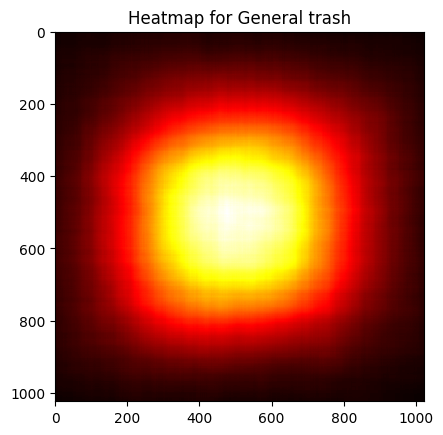

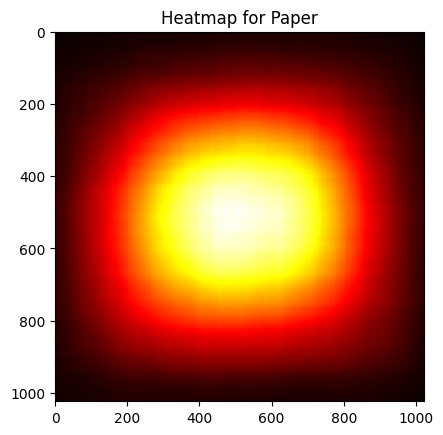

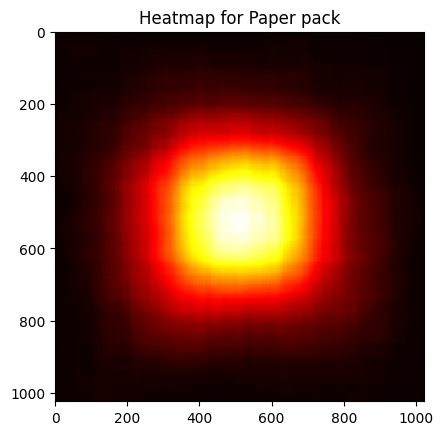

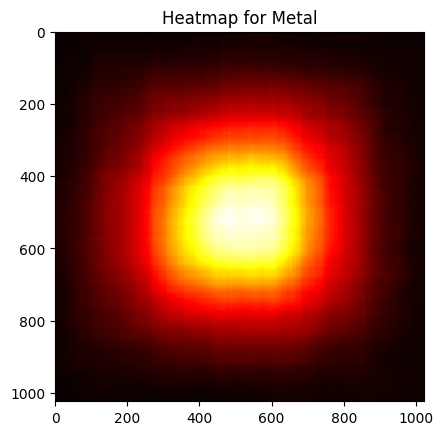

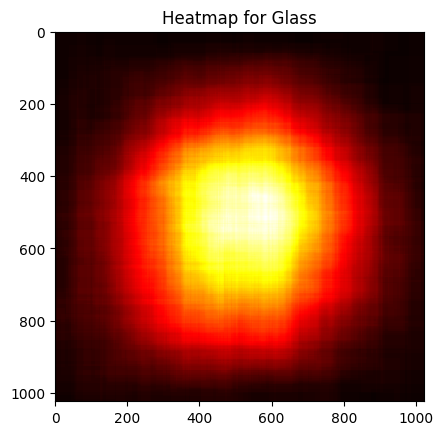

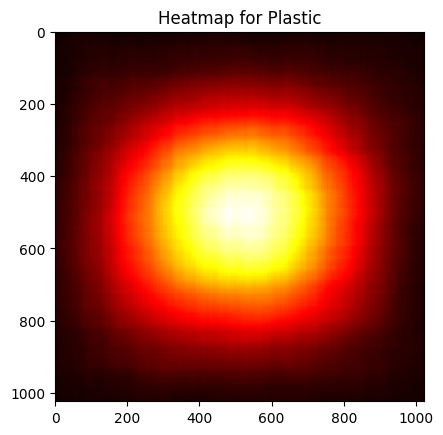

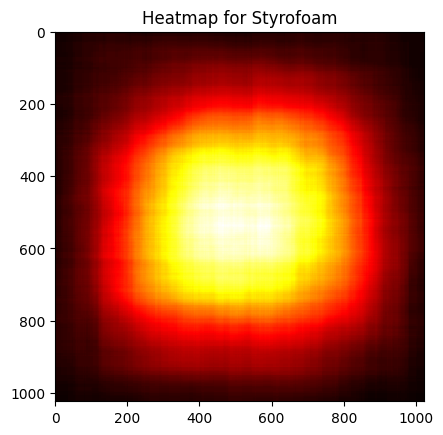

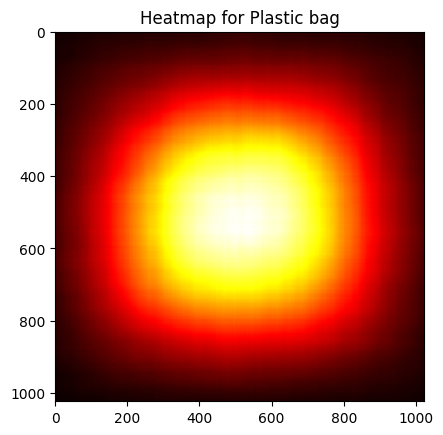

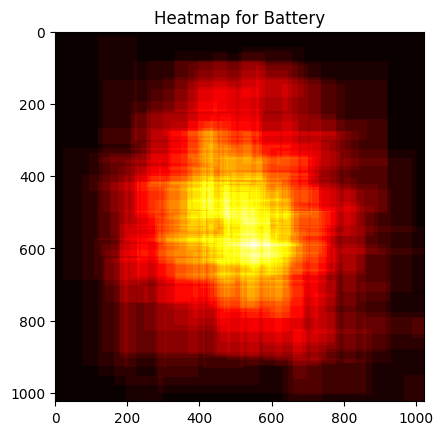

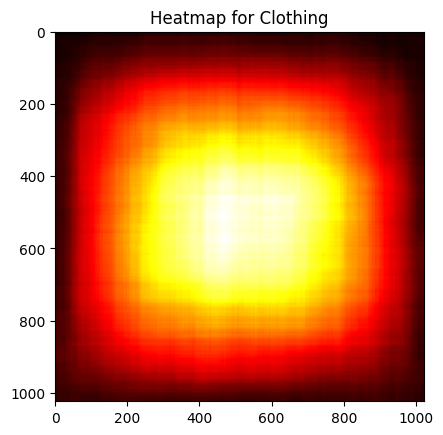

In [20]:
for class_id in range(len(classes)):
    heatmap_class = heatmap[:, :, class_id]
    plt.imshow(heatmap_class, cmap="hot", interpolation="nearest")
    plt.title(f"Heatmap for {classes[class_id]}")
    plt.show()

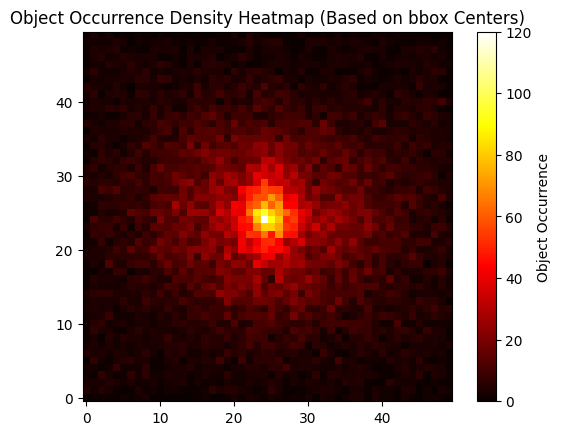

In [21]:
center_x = (train_df['x_min'] + train_df['x_max']) / 2
center_y = (train_df['y_min'] + train_df['y_max']) / 2

# 빈도 히트맵을 위한 2D 히스토그램
heatmap, xedges, yedges = np.histogram2d(center_x, center_y, bins=50)

plt.imshow(heatmap.T, origin='lower', cmap='hot', interpolation='nearest')
plt.colorbar(label="Object Occurrence")
plt.title("Object Occurrence Density Heatmap (Based on bbox Centers)")
plt.show()

- 클래스별로 bbox의 중심점을 기반으로 히트맵을 생성

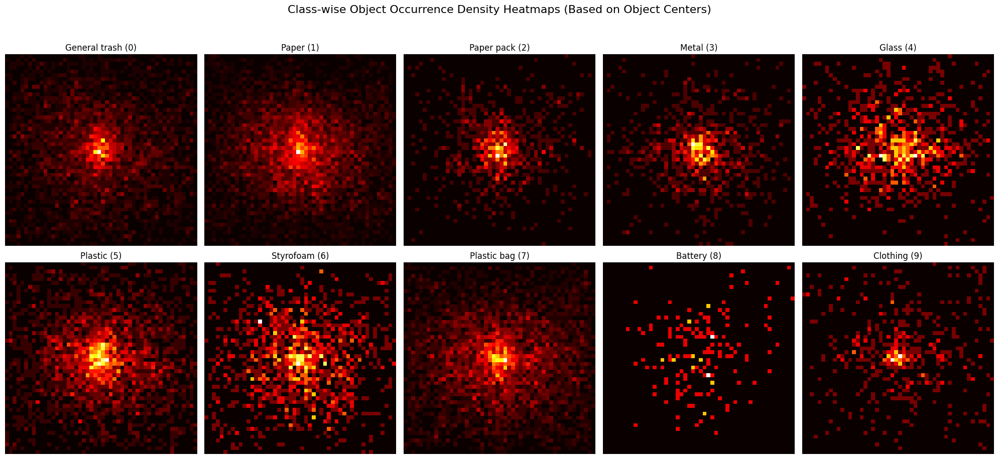

In [22]:
# 클래스 리스트 (0~9: 총 10개의 클래스)
classes = ["General trash", "Paper", "Paper pack", "Metal", "Glass", 
           "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing"]

# 히트맵 그리기 위한 설정
num_classes = len(classes)
fig, axes = plt.subplots(2, 5, figsize=(20, 10))  # 2행 5열로 히트맵을 배치

for i, cls in enumerate(classes):
    ax = axes[i // 5, i % 5]  # 각 클래스에 해당하는 subplot 지정

    # 해당 클래스의 중심 좌표 계산
    class_df = train_df[train_df['class_name'] == cls]
    center_x = (class_df['x_min'] + class_df['x_max']) / 2
    center_y = (class_df['y_min'] + class_df['y_max']) / 2

    # 2D 히스토그램 (히트맵)
    heatmap, xedges, yedges = np.histogram2d(center_x, center_y, bins=50, range=[[0, 1024], [0, 1024]])

    # 히트맵 시각화
    ax.imshow(heatmap.T, origin='lower', cmap='hot', interpolation='nearest')
    ax.set_title(f'{cls} ({i})')
    ax.set_axis_off()  # 축 숨기기

fig.suptitle("Class-wise Object Occurrence Density Heatmaps (Based on Object Centers)", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # 레이아웃 조정
plt.show()

### Intersection Over Union (IoU) Analysis

- 객체의 겹침 패턴을 분석. 복잡한 환경에서 객체들이 어떻게 배치되는지 알고 싶어 시도.

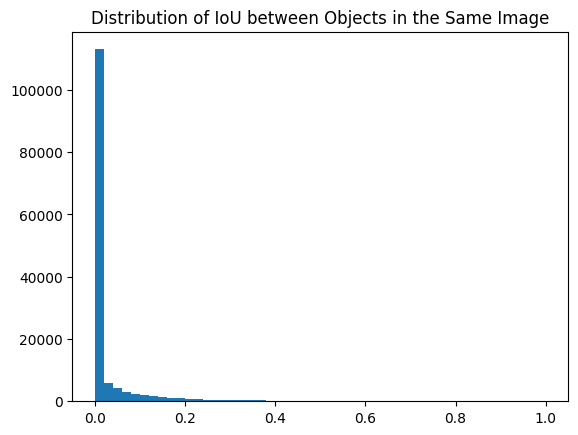

In [23]:
def calculate_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x1g, y1g, x2g, y2g = box2
    xi1 = max(x1, x1g)
    yi1 = max(y1, y1g)
    xi2 = min(x2, x2g)
    yi2 = min(y2, y2g)
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (x2 - x1) * (y2 - y1)
    box2_area = (x2g - x1g) * (y2g - y1g)
    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area != 0 else 0

iou_values = []
for image_id in train_df['image_id'].unique():
    bboxes = train_df[train_df['image_id'] == image_id][['x_min', 'y_min', 'x_max', 'y_max']].values
    for i in range(len(bboxes)):
        for j in range(i + 1, len(bboxes)):
            iou_values.append(calculate_iou(bboxes[i], bboxes[j]))
plt.hist(iou_values, bins=50)
plt.title("Distribution of IoU between Objects in the Same Image")
plt.show()

- x축: 두 객체 간 IoU 값 (0에서 1 사이의 값)
    - IoU 값은 두 객체의 바운딩 박스가 얼마나 겹치는지를 나타내는 지표. 값이 0이면 객체들이 전혀 겹치지 않고, 값이 1이면 객체들의 바운딩 박스가 완전히 동일하다는 것을 의미.
    - x축이 0에서 1 사이로 나뉘며, IoU 값이 0.0, 0.1, 0.2, ...와 같은 값들이 나타남.

- y축: 각 IoU 값에 해당하는 빈도수 (해당 IoU 구간에 속하는 바운딩 박스 쌍의 개수)
    - y축은 해당 IoU 값에 해당하는 두 객체 간 IoU가 얼마나 자주 나타나는지를 보여줌. 예를 들어, y축 값이 10000인 지점은 해당 IoU 값을 가지는 바운딩 박스 쌍의 개수가 10000개라는 의미.

- IoU가 0에 매우 집중되어 있음: 그래프의 대부분의 값이 0 근처에 몰려 있음. 이는 같은 이미지 내에 있는 객체들의 바운딩 박스가 서로 겹치지 않는 경우가 매우 많다는 것을 의미. 즉, 이미지 내에서 객체들 간에 겹침이 거의 없다는 것을 나타냄.
- IoU 값이 매우 낮은 경우가 대부분: IoU 값이 0에서 0.2 사이에 몰려 있는 것을 볼 수 있는데, 이는 이미지 내 객체들 간의 겹침이 있더라도 상당히 적은 부분만 겹치는 경우가 많다는 것을 의미.
- 높은 IoU 값이 거의 없음: IoU 값이 0.4 이상인 경우는 거의 나타나지 않고, 그래프가 해당 부분에서 급격히 낮아짐. 이는 객체들의 바운딩 박스가 완전히 겹치는 경우는 드물다는 것을 보여줌.


- 해석 결론:

이미지 내 객체들의 바운딩 박스는 거의 겹치지 않으며, 만약 겹친다고 하더라도 아주 일부만 겹치는 경우가 많음.
따라서 객체들이 이미지 내에서 명확하게 분리된 위치에 존재하는 경향이 있다고 해석할 수 있음.

[코드 추가 설명]

- 한 이미지에 여러 개의 바운딩 박스가 있을 때, 각각의 바운딩 박스 쌍에 대해 IoU(Intersection over Union)를 계산하는 것
- 한 이미지에 6개의 바운딩 박스가 있을 경우, 이 중에서 2개씩 짝을 지어 IoU를 계산
- 조합(combination)을 이용
    - n개의 바운딩 박스가 있다면, 2개씩 짝짓는 경우의 수 : nC2

```python
iou_values = []
for image_id in train_df['image_id'].unique():
    bboxes = train_df[train_df['image_id'] == image_id][['x_min', 'y_min', 'x_max', 'y_max']].values
    for i in range(len(bboxes)):
        for j in range(i + 1, len(bboxes)):
            iou_values.append(calculate_iou(bboxes[i], bboxes[j]))

- IoU 값을 저장할 리스트: iou_values 리스트를 만들어 IoU 값을 저장할 준비를 합니다.

- 이미지별 반복: for image_id in train_df['image_id'].unique():

    - 여기서 train_df['image_id'].unique()는 훈련 데이터에서 고유한 이미지 ID들을 가져옵니다. 각 이미지에 대해 반복합니다.

- 이미지별 바운딩 박스 정보 추출:
    - bboxes = train_df[train_df['image_id'] == image_id][['x_min', 'y_min', 'x_max', 'y_max']].values
    - 각 이미지에서 해당 이미지에 속하는 바운딩 박스 좌표 정보(x_min, y_min, x_max, y_max)를 가져옵니다.
    - bboxes는 이 좌표들을 담고 있는 numpy 배열

- 바운딩 박스 쌍 반복:
    - for i in range(len(bboxes)):
        - for j in range(i + 1, len(bboxes)):
    - 첫 번째 반복문은 i 번째 바운딩 박스를 선택하고, 두 번째 반복문은 i + 1 번째부터 시작해 나머지 바운딩 박스들과 짝을 이룹니다.
    - 즉, 두 개씩 짝을 짓기 위해서 모든 가능한 쌍을 선택하는 방식입니다. i + 1부터 반복을 시작하므로, 동일한 바운딩 박스끼리는 비교하지 않게 됩니다.

- IoU 계산 및 저장:
    - iou_values.append(calculate_iou(bboxes[i], bboxes[j]))
    - 두 바운딩 박스 bboxes[i]와 bboxes[j] 사이의 IoU 값을 계산하고, 그 값을 iou_values 리스트에 추가합니다.


- 만약 특정 이미지에 6개의 바운딩 박스가 있다고 가정하면:
    1. i = 0일 때 j는 1, 2, 3, 4, 5를 선택
    2. i = 1일 때 j는 2, 3, 4, 5를 선택
    3. i = 2일 때 j는 3, 4, 5를 선택
    4. ..
    - 모든 가능한 바운딩 박스 쌍에 대해 IoU를 계산
    - 이 과정을 모든 이미지에 대해 반복하여, 각 이미지에 속한 모든 바운딩 박스 쌍에 대해 IoU를 구하게 됩니다.

### Object Placement Symmetry(객체 배치 대칭성)

- 특정 클래스가 이미지의 왼쪽, 오른쪽, 상단, 하단 중 어디에 더 많이 배치되는지 확인을 위한 시각화.
- 모델이 특정 영역에 대해 편향될 가능성을 파악하는 데 유용할 것이라고 판단.

- x축: 바운딩 박스의 x 중심 좌표 (x_center)
- y축: 바운딩 박스의 y 중심 좌표 (y_center)
- 히트맵: 각 (x_center, y_center) 쌍에 대한 데이터 포인트의 밀도
- 양쪽 히스토그램:
    - 상단: x_center의 분포
    - 오른쪽: y_center의 분포

- 밀집 지역: 그림 중앙 부분(흑점 주변)에서 많은 바운딩 박스의 중심이 모여 있는 것을 볼 수 있습니다. 이는 객체들이 이미지의 중심 근처에 자주 배치된다는 것을 의미

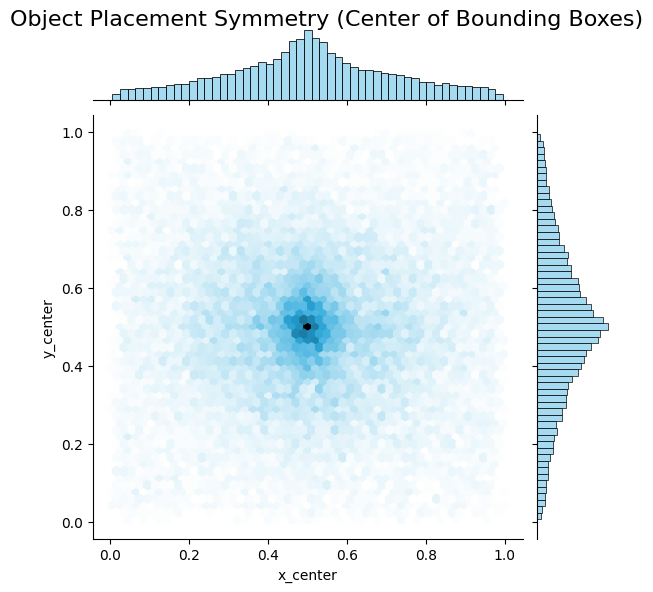

In [24]:
bbox_df['x_center'] = (bbox_df['x_min'] + bbox_df['x_max']) / 2
bbox_df['y_center'] = (bbox_df['y_min'] + bbox_df['y_max']) / 2
fig = sns.jointplot(x=bbox_df['x_center'], y=bbox_df['y_center'], kind="hex", color="skyblue")

fig.fig.suptitle("Object Placement Symmetry (Center of Bounding Boxes)", fontsize=16)
fig.fig.subplots_adjust(top=0.95)
plt.show()
# plt.title("Object Placement Symmetry (Center of Bounding Boxes)")
# plt.show()